# Purpose
The purpose of this notebook is to generate Figure 1.

# Preliminaries

## load packages

In [1]:
%matplotlib inline
%autosave 60
%load_ext autoreload
%autoreload 2

#filesystem
import os
import glob
from pathlib import Path
from tqdm import tqdm

#plotting
import seaborn as sns
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.colors as mcolors
import matplotlib.patches as patches
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from PIL import Image
from dateutil import rrule
import matplotlib.colors as mcolors

#data
import numpy as np
import pandas as pd
import random
import ast
import pickle
#import hdbscan
import networkx as nx
import community
from datetime import datetime, timedelta
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.ndimage import gaussian_filter
from scipy.io import wavfile

# custom modules
from src import parameters,rfid, plot
from src import timestamps

Autosaving every 60 seconds


## set paths

In [2]:
# project root - to reproduce, just change root to the full path to wild-mus-vocal-ecology
root = '/path/to/wild-mus-vocal-ecology'

# paths to jpegs
path_to_pic = os.path.join(root, 'parameters', 'images','summer_barn.jpeg')
path_to_map = os.path.join(root, 'parameters', 'images','barn_map_location_scale_500m.jpeg')
path_to_mouse_with_box = os.path.join(root, 'parameters', 'images','mouse_with_box.jpeg')
path_to_two_mice_in_box = os.path.join(root, 'parameters', 'images','two_mice_1_square_crop.jpeg')

# paths to barn interior schematic data
barriers_path = os.path.join(root,'parameters','barn_layout','newbarrierpos.csv')
box_coordinates_path = os.path.join(root,'parameters','barn_layout','boxpos.csv')
barrier_passages_path = os.path.join(root,'parameters','barn_layout', 'gates.csv')

# paths to population metadata
demography_metadata_path = os.path.join(root, 'data', 'phenotypes', 'All_popul_checks_update2023_transponder-and-popchecks.csv')

# path to save the figures
path_to_save = os.path.join(root, 'results', 'Figures', 'Figure_1')

# Make Figure 1

## Get the data

In [3]:
#get the barrier positions
print('getting barn schematic data...')
barriers = pd.read_csv(barriers_path)
boxes = pd.read_csv(box_coordinates_path)
passages = pd.read_csv(barrier_passages_path)

#get population metadata
print('getting metadata on the barn mouse population...')
demography = pd.read_csv(demography_metadata_path)
demography['Date'] = pd.to_datetime(demography['Date'])

getting barn schematic data...
getting metadata on the barn mouse population...


In [4]:
# for drawing lines on panel F to indicate extent of RFID and audio recording
datetimes = sorted(pd.to_datetime(demography['Date']).unique())
RFID_start, audio_start = pd.to_datetime('2013-01-01 00:00:00'), pd.to_datetime("2022-08-01 00:00:00")

RFID_coverage = datetimes.index(min(datetimes, key=lambda x: abs(x - RFID_start)))/len(datetimes)
audio_coverage = datetimes.index(min(datetimes, key=lambda x: abs(x - audio_start)))/len(datetimes)

## Make the figure

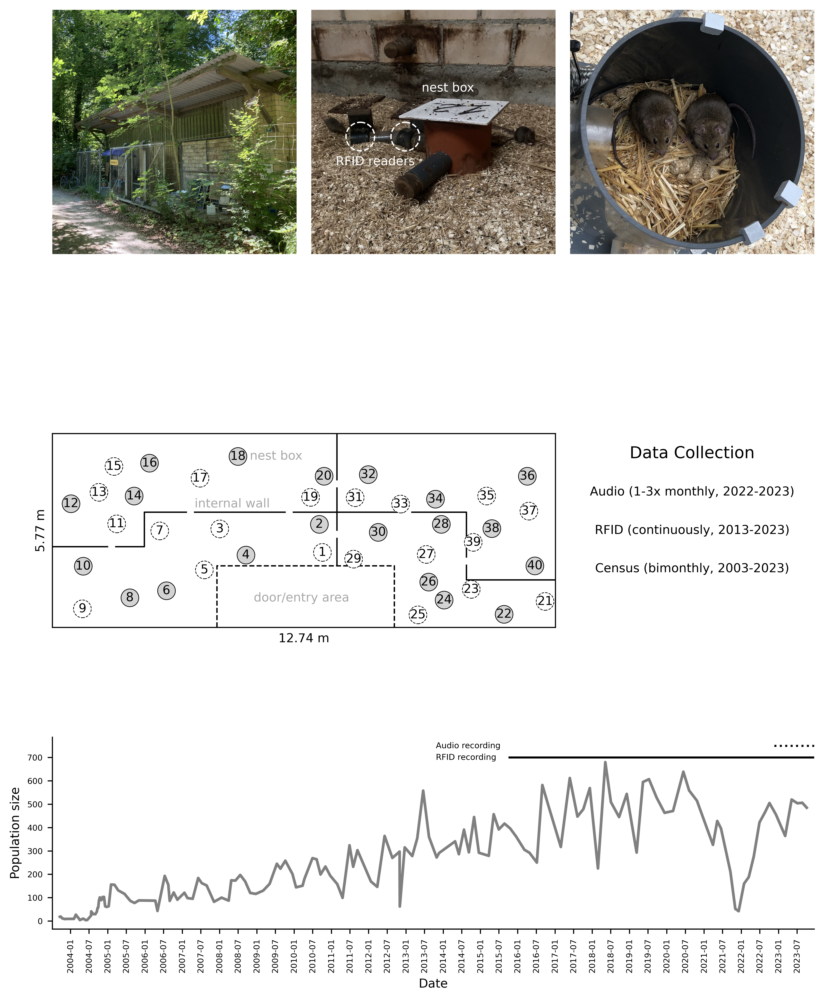

In [5]:
# save or not
save = False
path_to_save = ''

##################################################################################################

#set up the axes
fig, axes = plt.subplot_mosaic(mosaic="AAAABBBBCCCC;"\
                                      "DDDDDDDDEEEE;"\
                                      "FFFFFFFFFFFF",
                               figsize=[8.5,11], 
                               tight_layout=False,
                               gridspec_kw={"height_ratios": [1, 1, 0.5]},
                               dpi=600)

#plotting parameters
color_boxes = False
tick_label_fontsize = 6
axis_label_fontsize = 9
title_label_fontsize = 12
num_ticks = 40 # for panel F x-axis

# Plot and annotate the barn pictures
barn_pic, two_mice, barn_mouse = Image.open(path_to_pic), Image.open(path_to_two_mice_in_box), Image.open(path_to_mouse_with_box)
axes["A"].imshow(barn_pic)
axes["B"].imshow(barn_mouse)
axes["C"].imshow(two_mice)
axes["A"].axis("off")
axes["B"].axis("off")
axes["B"].axis("off")
axes["C"].axis("off")
axes["B"].text(1350, 1000, "nest box", fontsize=axis_label_fontsize, color="white")
axes["B"].text(300, 1900, "RFID readers", fontsize=axis_label_fontsize, color="white")
circle1 = patches.Circle((600, 1550), radius=175, edgecolor='white', facecolor='none', linestyle="--")
circle2 = patches.Circle((1150, 1550), radius=175, edgecolor='white', facecolor='none', linestyle="--")
axes["B"].add_patch(circle1)
axes["B"].add_patch(circle2)

#plot the barn schematic
if color_boxes:
    box_color_map = plot.get_box_colors(save=False) #optionally give each box a different color
else:
    box_color_map = {i: 'lightgrey' if i % 2 == 0 else 'white' for i in range(1, 41)}

plot.barn_layout(barriers = barriers, 
                 boxes = boxes , 
                 passages=passages, 
                 fig=fig, 
                 aspect=0.85, 
                 to_scale=False, 
                 box_colors = box_color_map, 
                 ax=axes["D"], color_boxes=True)

axes["D"].set_xlabel(str(barriers['x'].max())+' m', fontsize=axis_label_fontsize)
axes["D"].set_ylabel(str(barriers['y'].max())+' m', fontsize=axis_label_fontsize) 


axes["E"].text(0.5, 0.7, 'Data Collection', fontsize=title_label_fontsize, ha='center', va='center')
axes["E"].text(0.5, 0.6, 'Audio (1-3x monthly, 2022-2023)', fontsize=axis_label_fontsize, ha='center', va='center')
axes["E"].text(0.5, 0.5, 'RFID (continuously, 2013-2023)', fontsize=axis_label_fontsize, ha='center', va='center')
axes["E"].text(0.5, 0.4, 'Census (bimonthly, 2003-2023)', fontsize=axis_label_fontsize, ha='center', va='center')
axes["E"].axis('off')


# add the plot of population size by date (simplest)
sns.lineplot(data = demography, x = 'Date', y = 'Total mice', color = 'grey', ax = axes["F"], linewidth = 2)

axes["F"].tick_params(axis='x', rotation=90, labelsize = tick_label_fontsize)
axes["F"].tick_params(axis='y', labelsize = tick_label_fontsize)
axes["F"].set_ylabel("Population size", fontsize = axis_label_fontsize)
axes["F"].set_xlabel("Date", fontsize = axis_label_fontsize)
axes["F"].margins(x=0.01)
axes["F"].xaxis.set_major_locator(mdates.MonthLocator(interval=6)) 
axes["F"].axhline(y = 750, xmin = audio_coverage, xmax = 1, color = 'black', linestyle = "dotted")
axes["F"].axhline(y = 700, xmin = 0.6, xmax = 1, color = 'black')
axes["F"].text(16000, 750, 'Audio recording', fontsize=tick_label_fontsize, ha='left', va='center')
axes["F"].text(16000, 700, 'RFID recording', fontsize=tick_label_fontsize, ha='left', va='center')

sns.despine(ax = axes["F"])

# Adjust spacing
plt.subplots_adjust(wspace=0.5, hspace=0.06)

# save
if save:
    plt.savefig(os.path.join(path_to_save, 'Figure1.jpeg'), dpi = 600)
    plt.savefig(os.path.join(path_to_save, 'Figure1.svg'), dpi = 600)
    